# Using OpenSTL in your own project

In this notebook, we will provide a comprehensive guide on how to use OpenSTL for your own project. 

Firstly, we will process video data into `.npy` format for easier storage and access. Next, we will demonstrate how to utilize custom data within OpenSTL. Subsequently, we will use OpenSTL to train and evaluate models. Finally, we will visualize predicted frames and generate `.gif` images or videos. 

- [1. Preprocess your data](#1-process-your-data)
    - [1.1 Save the dataset](#11-save-the-dataset)
    - [1.2 Load the dataset and visualize an example](#12-load-the-dataset-and-visualize-an-example)

- [2. Utilize cumtom data](#2-utilize-cumtom-data)
    - [2.1 Define the dataset](#21-define-the-dataset)
    - [2.2 Get the dataloaders](#22-get-the-dataloaders)

- [3. Train and evaluate](#3-train-and-evaluate)
    - [3.1 Define the custom configs](#31-define-the-custom-configs)
    - [3.2 Setup the experiment](#32-setup-the-experiment)
    - [3.3 Start training and evaluation](#33)

- [4. Visualization](#4-visualization)
    - [4.1 Visualize in a line](#41-visualize-in-a-line)
    - [4.2 Generate a GIF](#42-generate-a-gif)

Here we go!

In [1]:
pre_seq_length = 10
aft_seq_length = 10
full_seq_length = pre_seq_length+aft_seq_length+1

## 0. Convert input data to compatible formats

### 0.1. Convert DAD dataset's data 

In [2]:
import cv2

def convert_video_to_avi(input_file, output_file, width, height, frames):
    cap = cv2.VideoCapture(input_file)

    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'XVID')

    frame_count = 0
    part_number = 1
    out = None

    while True:
        ret, frame = cap.read()

        if not ret:
            if frame_count > 0:
                # Release the last part if it contains enough frames
                if frame_count >= frames:
                    out.release()
                else:
                    # Remove the last part if it doesn't meet the frame requirement
                    output_part = f"{output_file}_part{part_number}.avi"
                    if os.path.exists(output_part):
                        os.remove(output_part)
            break

        if frame_count % frames == 0:
            # Close previous video writer and create a new one for each part
            if out is not None:
                out.release()

            output_part = f"{output_file}_part{part_number}.avi"
            out = cv2.VideoWriter(output_part, fourcc, fps, (width, height))
            part_number += 1
            frame_count = 0

        resized_frame = cv2.resize(frame, (width, height))
        out.write(resized_frame)
        frame_count += 1

    cap.release()
    if out is not None:
        out.release()


In [3]:
import os

def convert_all_videos_in_folder(input_folder, output_folder, tag, frames):
    os.makedirs(output_folder, exist_ok=True)
    for filename in os.listdir(input_folder):
        if filename.endswith('.mp4'):
            input_video_path = os.path.join(input_folder, filename)
            output_video_name = f"{os.path.splitext(filename)[0]}{tag}"
            output_video_path = os.path.join(output_folder, output_video_name)
            convert_video_to_avi(input_video_path, output_video_path,128,128, frames)
    print('Successfully Converted')


In [4]:
input_train = 'dad/videos/training/positive'  
output_train = 'train'  
#convert_all_videos_in_folder(input_train, output_train,"_p",full_seq_length)

In [5]:
input_train = 'dad/videos/training/negative'  
output_train = 'train'  
#convert_all_videos_in_folder(input_train, output_train,"_n",full_seq_length)

In [6]:
input_test = 'dad/videos/testing/positive'  
output_test = 'test'  
#convert_all_videos_in_folder(input_test, output_test,"_p",full_seq_length)

In [7]:
input_test = 'dad/videos/testing/negative'  
output_test = 'test'  
#convert_all_videos_in_folder(input_test, output_test,"_n",full_seq_length)

In [8]:
input_val = 'dad/videos/val/positive'  
output_val = 'val' 
#convert_all_videos_in_folder(input_val, output_val,"_p",full_seq_length)

In [9]:
input_val = 'dad/videos/val/negative'  
output_val = 'val' 
#convert_all_videos_in_folder(input_val, output_val,"_n",full_seq_length)

## 1. Process your data

Assume you possess a collection of videos and have already sorted them into the `train/`, `val/`, and `test/` directories. The subsequent step involves transforming these videos into a `.pkl` file for further manipulations.

The existing file hierarchy is as follows:

- custom_usage.ipynb
- train
  - train_example1.avi
  - train_example2.avi
- val
  - val_example1.avi
  - val_example2.avi
- test
  - test_example.avi

It's crucial to note that the above example represents a simplified scenario where we've used `.avi` videos for illustrative purposes. However, in a real-world application, you are free to employ videos in various other formats.

We utilize several videos from the KTH dataset as examples. Although the original KTH dataset consists of single-channel grayscale videos, we save them as three-channel RGB videos to accommodate a broader range of use cases.

### 1.1 Save the dataset

Here, we default to uniformly sampling several frames from the given video data. The number of observed frames and future frames are two hyperparameters (`pre_seq_length`, `aft_seq_length`) that are set in advance. You can also choose to sample the video in other ways and save the data.

#### hyperparameters

`pre_seq_length`: the number of given frames

`aft_seq_length`: the number of frames to predict

In [10]:
import cv2
import numpy as np
import os

def sample_frames(video_path, num_frames=20):
    # read the video
    video = cv2.VideoCapture(video_path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    # uniformly sample frames for given frame count from the video
    frame_idxs = np.linspace(0, total_frames-1, num_frames, dtype=int)
    frames = []
    for idx in frame_idxs:
        video.set(cv2.CAP_PROP_POS_FRAMES, idx)
        _, frame = video.read()
        # frame = cv2.resize(frame, (height, width))
        frames.append(frame)
    video.release()
    return np.stack(frames)

def process_folder(folder_path, pre_slen=10, aft_slen=10, suffix='.avi'):
    # get all the videos in this folder
    videos = []
    files = os.listdir(folder_path)
    for file in files:
        video_path = os.path.join(folder_path, file)
        if os.path.isfile(video_path) and file.endswith(suffix):
            video = sample_frames(video_path, pre_slen + aft_slen)
            videos.append(video)
    # stack video frames from each folder
    data = np.stack(videos).transpose(0, 1, 4, 2, 3)

    # if the data is in [0, 255], rescale it into [0, 1]
    if data.max() > 1.0:
        data = data.astype(np.float32) / 255.0

    return data[:, :pre_slen], data[:, pre_slen:]

In [11]:
import pickle

folders = ['train', 'val', 'test']
for folder in folders:
    # Process each folder and get the data
    data_x, data_y = process_folder(folder, pre_slen=pre_seq_length, aft_slen=aft_seq_length, suffix='.avi')
    
    # Create a dictionary to store the data for the specific folder
    dataset = {
        'X_' + folder: data_x,
        'Y_' + folder: data_y
    }
    
    # Save each folder's data in a separate pkl file
    with open(f'dataset_{folder}.pkl', 'wb') as f:
        pickle.dump(dataset, f)


## 2. Utilize custom data

### 2.1 Define the dataset

We first define the `CustomDataset` to use the provided dataset. 

For real video prediction, to facilitate model optimization, we strongly recommend users to use frames represented as `float32` with values in the range of $[0, 1]$, rather than frames represented as `uint8` with values in the range of $[0, 255]$. For other types of data, we also provide the option to `normalize` in the `CustomDataset`.

In [5]:
import torch
from torch.utils.data import Dataset


class CustomDataset(Dataset):
    def __init__(self, X, Y, normalize=False, data_name='custom'):
        super(CustomDataset, self).__init__()
        self.X = X
        self.Y = Y
        self.mean = None
        self.std = None
        self.data_name = data_name

        if normalize:
            # get the mean/std values along the channel dimension
            mean = data.mean(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            std = data.std(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            data = (data - mean) / std
            self.mean = mean
            self.std = std

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, index):
        data = torch.tensor(self.X[index]).float()
        labels = torch.tensor(self.Y[index]).float()
        return data, labels

### 2.2 Get the dataloaders

Now we can get the dataloaders by using the collected dataset and the defined `CustomDataset`.

#### hyperparameters

`batch_size`: the size of a batch

In [6]:
batch_size = 10

In [ ]:
import pickle

# Load the training data
with open('dataset_train.pkl', 'rb') as f:
    train_data = pickle.load(f)
X_train, Y_train = train_data['X_train'], train_data['Y_train']
print(X_train.shape)

train_set = CustomDataset(X=X_train, Y=Y_train)

In [ ]:
# Load the validation data
with open('dataset_val.pkl', 'rb') as f:
    val_data = pickle.load(f)
X_val, Y_val = val_data['X_val'], val_data['Y_val']
print(X_val.shape)

val_set = CustomDataset(X=X_val, Y=Y_val)

In [ ]:
# Load the test data
with open('dataset_test.pkl', 'rb') as f:
    test_data = pickle.load(f)
X_test, Y_test = test_data['X_test'], test_data['Y_test']
print(X_test.shape)

test_set = CustomDataset(X=X_test, Y=Y_test)

In [8]:
dataloader_train = torch.utils.data.DataLoader(
    train_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_val = torch.utils.data.DataLoader(
    val_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_test = torch.utils.data.DataLoader(
    test_set, batch_size=batch_size, shuffle=True, pin_memory=True)

### 2.3 Visualize data

In [ ]:
from openstl.utils import show_video_line

# show the given frames from an example
example_idx = 0
show_video_line(X_train[example_idx], ncols=pre_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

In [ ]:
from openstl.utils import show_video_line

# show the given predicted frames from an example
example_idx = 0
show_video_line(Y_train[example_idx], ncols=pre_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

## 3. Train and evaluate

### 3.1 Define the custom configs

We first define the training configuration, which includes several important hyperparameters for training.

Here, we set `epoch = 3` as an example for simple training. The actual value of epoch in your project depends on the complexity of your dataset. Generally, a good starting point is `epoch = 100`.

Next, we define the model configuration to customize a spatio-temporal predictive learning model. For MetaVP models, the key hyperparameters are: `N_S`, `N_T`, `hid_S`, `hid_T`, and `model_type`. Users have the option to either use a config file or directly set these hyperparameters.

If a config file is preferred, the user can simply include a `config_file` key with the path to the config file in the `custom_model_config` below. Otherwise, the user can directly specify these hyperparameters in the `custom_model_config`.

In [9]:
custom_training_config = {
    'pre_seq_length': pre_seq_length,
    'aft_seq_length': aft_seq_length,
    'total_length': pre_seq_length + aft_seq_length,
    'batch_size': batch_size,
    'val_batch_size': batch_size,
    'epoch': 60,
    'lr': 0.01,   
    'metrics': ['mse', 'mae'],

    'ex_name': 'custom_exp',
    'dataname': 'custom',
    'in_shape': [10, 3, 128,128],
}

custom_model_config = {
    # For MetaVP models, the most important hyperparameters are: 
    # N_S, N_T, hid_S, hid_T, model_type
    'method': 'TAU',
    # Users can either using a config file or directly set these hyperparameters 
    # 'config_file': 'configs/custom/example_model.py',
    
    # Here, we directly set these parameters
    'model_type': 'tau',
    'N_S': 4,
    'N_T': 8,
    'hid_S': 64,
    'hid_T': 256,
    'alpha':0.1
}

### 3.2 Setup the experiment

We retrieve the default hyperparameters by utilizing `create_parser` and update those hyperparameters that are defined in `custom_training_config` and `custom_model_config`. 

By utilizing `BaseExperiment`, we ensure that everything is prepared, including dataloader setup and model initialization.

In [10]:
from openstl.api import BaseExperiment
from openstl.utils import create_parser, default_parser

args = create_parser().parse_args([])
config = args.__dict__

# update the training config
config.update(custom_training_config)
# update the model config
config.update(custom_model_config)
# fulfill with default values
default_values = default_parser()
for attribute in default_values.keys():
    if config[attribute] is None:
        config[attribute] = default_values[attribute]

exp = BaseExperiment(args, dataloaders=(dataloader_train, dataloader_val, dataloader_test), strategy='auto')

/home/nimsara_20/anaconda3/envs/OpenSTL/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### 3.3 Start training and evaluation

With everything in place, we are now ready to start training and evaluation. 

Here we go!

In [11]:
print('>'*35 + ' training ' + '<'*35)
exp.train()

print('>'*35 + ' testing  ' + '<'*35)
exp.test()

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> training <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<



  | Name      | Type        | Params | Mode 
--------------------------------------------------
0 | model     | SimVP_Model | 17.8 M | train
1 | criterion | MSELoss     | 0      | train
--------------------------------------------------
17.8 M    Trainable params
0         Non-trainable params
17.8 M    Total params
71.245    Total estimated model params size (MB)
263       Modules in train mode
0         Modules in eval mode


Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.10.8 | packaged by conda-forge | (main, Nov 22 2022, 08:26:04) [GCC 10.4.0]
CUDA available: True
CUDA_HOME: /usr
NVCC: Cuda compilation tools, release 10.1, V10.1.243
GPU 0,1: Tesla T4
GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
PyTorch: 2.4.1+cu121
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.4.2 (Git Hash 1137e04ec0b5251ca2b4400a4fd3c667ce843d67)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute

Epoch 0, global step 310: 'val_loss' reached 0.01642 (best 0.01642), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=00-val_loss=0.016.ckpt' as top 1


Epoch 1: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.009
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 1: Lr: 0.0004263 | Train Loss: 0.0210899 | Vali Loss: 0.0172290

Epoch 1: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.009

Epoch 1, global step 620: 'val_loss' was not in top 1


Epoch 2: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.011
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 2: Lr: 0.0004591 | Train Loss: 0.0146033 | Vali Loss: 0.0114545

Epoch 2: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.011

Epoch 2, global step 930: 'val_loss' reached 0.01145 (best 0.01145), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=02-val_loss=0.011.ckpt' as top 1


Epoch 3: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.015
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 3: Lr: 0.0005049 | Train Loss: 0.0133099 | Vali Loss: 0.0111677

Epoch 3: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.015

Epoch 3, global step 1240: 'val_loss' reached 0.01117 (best 0.01117), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=03-val_loss=0.011.ckpt' as top 1


Epoch 4: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.011
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.46it/s]Epoch 4: Lr: 0.0005636 | Train Loss: 0.0121888 | Vali Loss: 0.0108596

Epoch 4: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.011

Epoch 4, global step 1550: 'val_loss' reached 0.01086 (best 0.01086), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=04-val_loss=0.011.ckpt' as top 1


Epoch 5: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.010
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 5: Lr: 0.0006350 | Train Loss: 0.0116177 | Vali Loss: 0.0103538

Epoch 5: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.010

Epoch 5, global step 1860: 'val_loss' reached 0.01035 (best 0.01035), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=05-val_loss=0.010.ckpt' as top 1


Epoch 6: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.008
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 6: Lr: 0.0007188 | Train Loss: 0.0114848 | Vali Loss: 0.0113834

Epoch 6: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.008

Epoch 6, global step 2170: 'val_loss' was not in top 1


Epoch 7: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.010
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 7: Lr: 0.0008150 | Train Loss: 0.0113202 | Vali Loss: 0.0100874

Epoch 7: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.010

Epoch 7, global step 2480: 'val_loss' reached 0.01009 (best 0.01009), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=07-val_loss=0.010.ckpt' as top 1


Epoch 8: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.008
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 8: Lr: 0.0009232 | Train Loss: 0.0110511 | Vali Loss: 0.0122912

Epoch 8: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.008

Epoch 8, global step 2790: 'val_loss' was not in top 1


Epoch 9: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.008
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 9: Lr: 0.0010431 | Train Loss: 0.0109143 | Vali Loss: 0.0097952

Epoch 9: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.008

Epoch 9, global step 3100: 'val_loss' reached 0.00980 (best 0.00980), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=09-val_loss=0.010.ckpt' as top 1


Epoch 10: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 10: Lr: 0.0011745 | Train Loss: 0.0107228 | Vali Loss: 0.0102671

Epoch 10: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 10, global step 3410: 'val_loss' was not in top 1


Epoch 11: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 11: Lr: 0.0013168 | Train Loss: 0.0104556 | Vali Loss: 0.0103867

Epoch 11: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 11, global step 3720: 'val_loss' was not in top 1


Epoch 12: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 12: Lr: 0.0014698 | Train Loss: 0.0103095 | Vali Loss: 0.0113113

Epoch 12: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 12, global step 4030: 'val_loss' was not in top 1


Epoch 13: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 13: Lr: 0.0016330 | Train Loss: 0.0100982 | Vali Loss: 0.0099037

Epoch 13: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 13, global step 4340: 'val_loss' was not in top 1


Epoch 14: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 14: Lr: 0.0018060 | Train Loss: 0.0100963 | Vali Loss: 0.0102226

Epoch 14: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 14, global step 4650: 'val_loss' was not in top 1


Epoch 15: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 15: Lr: 0.0019883 | Train Loss: 0.0098376 | Vali Loss: 0.0097429

Epoch 15: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 15, global step 4960: 'val_loss' reached 0.00974 (best 0.00974), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=15-val_loss=0.010.ckpt' as top 1


Epoch 16: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 16: Lr: 0.0021794 | Train Loss: 0.0098047 | Vali Loss: 0.0100096

Epoch 16: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 16, global step 5270: 'val_loss' was not in top 1


Epoch 17: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 17: Lr: 0.0023788 | Train Loss: 0.0097449 | Vali Loss: 0.0097859

Epoch 17: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 17, global step 5580: 'val_loss' was not in top 1


Epoch 18: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.46it/s]Epoch 18: Lr: 0.0025859 | Train Loss: 0.0095863 | Vali Loss: 0.0101627

Epoch 18: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 18, global step 5890: 'val_loss' was not in top 1


Epoch 19: 100%|█| 310/310 [04:27<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 19: Lr: 0.0028002 | Train Loss: 0.0093572 | Vali Loss: 0.0109057

Epoch 19: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 19, global step 6200: 'val_loss' was not in top 1


Epoch 20: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 20: Lr: 0.0030211 | Train Loss: 0.0092258 | Vali Loss: 0.0103967

Epoch 20: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 20, global step 6510: 'val_loss' was not in top 1


Epoch 21: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 21: Lr: 0.0032479 | Train Loss: 0.0091973 | Vali Loss: 0.0099816

Epoch 21: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 21, global step 6820: 'val_loss' was not in top 1


Epoch 22: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 22: Lr: 0.0034801 | Train Loss: 0.0093296 | Vali Loss: 0.0100354

Epoch 22: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 22, global step 7130: 'val_loss' was not in top 1


Epoch 23: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 23: Lr: 0.0037170 | Train Loss: 0.0092535 | Vali Loss: 0.0107447

Epoch 23: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 23, global step 7440: 'val_loss' was not in top 1


Epoch 24: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 24: Lr: 0.0039580 | Train Loss: 0.0090247 | Vali Loss: 0.0094492

Epoch 24: 100%|█| 310/310 [04:53<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 24, global step 7750: 'val_loss' reached 0.00945 (best 0.00945), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=24-val_loss=0.009.ckpt' as top 1


Epoch 25: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 25: Lr: 0.0042024 | Train Loss: 0.0089020 | Vali Loss: 0.0126859

Epoch 25: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 25, global step 8060: 'val_loss' was not in top 1


Epoch 26: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 26: Lr: 0.0044495 | Train Loss: 0.0094279 | Vali Loss: 0.0101152

Epoch 26: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 26, global step 8370: 'val_loss' was not in top 1


Epoch 27: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 27: Lr: 0.0046986 | Train Loss: 0.0091049 | Vali Loss: 0.0103686

Epoch 27: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 27, global step 8680: 'val_loss' was not in top 1


Epoch 28: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 28: Lr: 0.0049492 | Train Loss: 0.0089360 | Vali Loss: 0.0097736

Epoch 28: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 28, global step 8990: 'val_loss' was not in top 1


Epoch 29: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 29: Lr: 0.0052004 | Train Loss: 0.0092022 | Vali Loss: 0.0096796

Epoch 29: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 29, global step 9300: 'val_loss' was not in top 1


Epoch 30: 100%|█| 310/310 [04:26<00:00,  1.16it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.46it/s]Epoch 30: Lr: 0.0054516 | Train Loss: 0.0087458 | Vali Loss: 0.0095863

Epoch 30: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 30, global step 9610: 'val_loss' was not in top 1


Epoch 31: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 31: Lr: 0.0057022 | Train Loss: 0.0085114 | Vali Loss: 0.0092922

Epoch 31: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 31, global step 9920: 'val_loss' reached 0.00929 (best 0.00929), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=31-val_loss=0.009.ckpt' as top 1


Epoch 32: 100%|█| 310/310 [04:26<00:00,  1.17it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 32: Lr: 0.0059513 | Train Loss: 0.0084084 | Vali Loss: 0.0094704

Epoch 32: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 32, global step 10230: 'val_loss' was not in top 1


Epoch 33: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.46it/s]Epoch 33: Lr: 0.0061984 | Train Loss: 0.0084752 | Vali Loss: 0.0096607

Epoch 33: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 33, global step 10540: 'val_loss' was not in top 1


Epoch 34: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 34: Lr: 0.0064428 | Train Loss: 0.0084735 | Vali Loss: 0.0100609

Epoch 34: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 34, global step 10850: 'val_loss' was not in top 1


Epoch 35: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 35: Lr: 0.0066837 | Train Loss: 0.0084768 | Vali Loss: 0.0104313

Epoch 35: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 35, global step 11160: 'val_loss' was not in top 1


Epoch 36: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 36: Lr: 0.0069206 | Train Loss: 0.0083458 | Vali Loss: 0.0106665

Epoch 36: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 36, global step 11470: 'val_loss' was not in top 1


Epoch 37: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 37: Lr: 0.0071528 | Train Loss: 0.0092131 | Vali Loss: 0.0096964

Epoch 37: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 37, global step 11780: 'val_loss' was not in top 1


Epoch 38: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.46it/s]Epoch 38: Lr: 0.0073796 | Train Loss: 0.0090339 | Vali Loss: 0.0110350

Epoch 38: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 38, global step 12090: 'val_loss' was not in top 1


Epoch 39: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 39: Lr: 0.0076005 | Train Loss: 0.0083800 | Vali Loss: 0.0096598

Epoch 39: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 39, global step 12400: 'val_loss' was not in top 1


Epoch 40: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 40: Lr: 0.0078147 | Train Loss: 0.0081535 | Vali Loss: 0.0111418

Epoch 40: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 40, global step 12710: 'val_loss' was not in top 1


Epoch 41: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 41: Lr: 0.0080218 | Train Loss: 0.0081326 | Vali Loss: 0.0127408

Epoch 41: 100%|█| 310/310 [04:52<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 41, global step 13020: 'val_loss' was not in top 1


Epoch 42: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 42: Lr: 0.0082212 | Train Loss: 0.0080900 | Vali Loss: 0.0093427

Epoch 42: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 42, global step 13330: 'val_loss' was not in top 1


Epoch 43: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 43: Lr: 0.0084123 | Train Loss: 0.0079244 | Vali Loss: 0.0109635

Epoch 43: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 43, global step 13640: 'val_loss' was not in top 1


Epoch 44: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 44: Lr: 0.0085945 | Train Loss: 0.0083392 | Vali Loss: 0.0102301

Epoch 44: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.01

Epoch 44, global step 13950: 'val_loss' was not in top 1


Epoch 45: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 45: Lr: 0.0087675 | Train Loss: 0.0083870 | Vali Loss: 0.0094468

Epoch 45: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 45, global step 14260: 'val_loss' was not in top 1


Epoch 46: 100%|█| 310/310 [04:24<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 46: Lr: 0.0089307 | Train Loss: 0.0080371 | Vali Loss: 0.0094317

Epoch 46: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 46, global step 14570: 'val_loss' was not in top 1


Epoch 47: 100%|█| 310/310 [04:24<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 47: Lr: 0.0090837 | Train Loss: 0.0079768 | Vali Loss: 0.0107304

Epoch 47: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 47, global step 14880: 'val_loss' was not in top 1


Epoch 48: 100%|█| 310/310 [04:24<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 48: Lr: 0.0092260 | Train Loss: 0.0082040 | Vali Loss: 0.0095426

Epoch 48: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 48, global step 15190: 'val_loss' was not in top 1


Epoch 49: 100%|█| 310/310 [04:25<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 49: Lr: 0.0093573 | Train Loss: 0.0082244 | Vali Loss: 0.0093919

Epoch 49: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 49, global step 15500: 'val_loss' was not in top 1


Epoch 50: 100%|█| 310/310 [04:24<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 50: Lr: 0.0094771 | Train Loss: 0.0079336 | Vali Loss: 0.0093526

Epoch 50: 100%|█| 310/310 [04:51<00:00,  1.06it/s, v_num=0, train_loss_step=0.00

Epoch 50, global step 15810: 'val_loss' was not in top 1


Epoch 51: 100%|█| 310/310 [04:24<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 51: Lr: 0.0095853 | Train Loss: 0.0077054 | Vali Loss: 0.0091453

Epoch 51: 100%|█| 310/310 [04:51<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 51, global step 16120: 'val_loss' reached 0.00915 (best 0.00915), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=51-val_loss=0.009.ckpt' as top 1


Epoch 52: 100%|█| 310/310 [04:24<00:00,  1.17it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 52: Lr: 0.0096814 | Train Loss: 0.0075334 | Vali Loss: 0.0105194

Epoch 52: 100%|█| 310/310 [04:51<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 52, global step 16430: 'val_loss' was not in top 1


Epoch 53: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 53: Lr: 0.0097653 | Train Loss: 0.0078563 | Vali Loss: 0.0095965

Epoch 53: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 53, global step 16740: 'val_loss' was not in top 1


Epoch 54: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 54: Lr: 0.0098366 | Train Loss: 0.0091175 | Vali Loss: 0.0108812

Epoch 54: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 54, global step 17050: 'val_loss' was not in top 1


Epoch 55: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 55: Lr: 0.0098953 | Train Loss: 0.0093078 | Vali Loss: 0.0101058

Epoch 55: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 55, global step 17360: 'val_loss' was not in top 1


Epoch 56: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 56: Lr: 0.0099410 | Train Loss: 0.0089206 | Vali Loss: 0.0097537

Epoch 56: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.01

Epoch 56, global step 17670: 'val_loss' was not in top 1


Epoch 57: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 57: Lr: 0.0099738 | Train Loss: 0.0085259 | Vali Loss: 0.0090070

Epoch 57: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.01

Epoch 57, global step 17980: 'val_loss' reached 0.00901 (best 0.00901), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=57-val_loss=0.009.ckpt' as top 1


Epoch 58: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 58: Lr: 0.0099935 | Train Loss: 0.0079607 | Vali Loss: 0.0101164

Epoch 58: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 58, global step 18290: 'val_loss' was not in top 1


Epoch 59: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 59: Lr: 0.0100000 | Train Loss: 0.0076699 | Vali Loss: 0.0091374

Epoch 59: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 59, global step 18600: 'val_loss' was not in top 1


Epoch 60: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 60: Lr: 0.0099987 | Train Loss: 0.0075352 | Vali Loss: 0.0091000

Epoch 60: 100%|█| 310/310 [04:50<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 60, global step 18910: 'val_loss' was not in top 1


Epoch 61: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 61: Lr: 0.0099949 | Train Loss: 0.0072786 | Vali Loss: 0.0091990

Epoch 61: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 61, global step 19220: 'val_loss' was not in top 1


Epoch 62: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 62: Lr: 0.0099887 | Train Loss: 0.0070836 | Vali Loss: 0.0092865

Epoch 62: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 62, global step 19530: 'val_loss' was not in top 1


Epoch 63: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 63: Lr: 0.0099798 | Train Loss: 0.0070686 | Vali Loss: 0.0090997

Epoch 63: 100%|█| 310/310 [04:50<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 63, global step 19840: 'val_loss' was not in top 1


Epoch 64: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 64: Lr: 0.0099685 | Train Loss: 0.0070714 | Vali Loss: 0.0095877

Epoch 64: 100%|█| 310/310 [04:50<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 64, global step 20150: 'val_loss' was not in top 1


Epoch 65: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 65: Lr: 0.0099547 | Train Loss: 0.0072460 | Vali Loss: 0.0091609

Epoch 65: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 65, global step 20460: 'val_loss' was not in top 1


Epoch 66: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 66: Lr: 0.0099384 | Train Loss: 0.0069901 | Vali Loss: 0.0089463

Epoch 66: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 66, global step 20770: 'val_loss' reached 0.00895 (best 0.00895), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=66-val_loss=0.009.ckpt' as top 1


Epoch 67: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 67: Lr: 0.0099196 | Train Loss: 0.0068787 | Vali Loss: 0.0091438

Epoch 67: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 67, global step 21080: 'val_loss' was not in top 1


Epoch 68: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 68: Lr: 0.0098983 | Train Loss: 0.0067972 | Vali Loss: 0.0093649

Epoch 68: 100%|█| 310/310 [04:50<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 68, global step 21390: 'val_loss' was not in top 1


Epoch 69: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 69: Lr: 0.0098746 | Train Loss: 0.0068382 | Vali Loss: 0.0091507

Epoch 69: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.01

Epoch 69, global step 21700: 'val_loss' was not in top 1


Epoch 70: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 70: Lr: 0.0098484 | Train Loss: 0.0090090 | Vali Loss: 0.0091279

Epoch 70: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 70, global step 22010: 'val_loss' was not in top 1


Epoch 71: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 71: Lr: 0.0098197 | Train Loss: 0.0070788 | Vali Loss: 0.0091750

Epoch 71: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 71, global step 22320: 'val_loss' was not in top 1


Epoch 72: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 72: Lr: 0.0097887 | Train Loss: 0.0066771 | Vali Loss: 0.0090033

Epoch 72: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 72, global step 22630: 'val_loss' was not in top 1


Epoch 73: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 73: Lr: 0.0097552 | Train Loss: 0.0066325 | Vali Loss: 0.0092694

Epoch 73: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 73, global step 22940: 'val_loss' was not in top 1


Epoch 74: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 74: Lr: 0.0097193 | Train Loss: 0.0064930 | Vali Loss: 0.0091255

Epoch 74: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 74, global step 23250: 'val_loss' was not in top 1


Epoch 75: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 75: Lr: 0.0096810 | Train Loss: 0.0064243 | Vali Loss: 0.0088892

Epoch 75: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.01

Epoch 75, global step 23560: 'val_loss' reached 0.00889 (best 0.00889), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=75-val_loss=0.009.ckpt' as top 1


Epoch 76: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 76: Lr: 0.0096404 | Train Loss: 0.0063748 | Vali Loss: 0.0090642

Epoch 76: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 76, global step 23870: 'val_loss' was not in top 1


Epoch 77: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 77: Lr: 0.0095975 | Train Loss: 0.0063201 | Vali Loss: 0.0090448

Epoch 77: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 77, global step 24180: 'val_loss' was not in top 1


Epoch 78: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 78: Lr: 0.0095522 | Train Loss: 0.0062886 | Vali Loss: 0.0089549

Epoch 78: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 78, global step 24490: 'val_loss' was not in top 1


Epoch 79: 100%|█| 310/310 [04:23<00:00,  1.18it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 79: Lr: 0.0095047 | Train Loss: 0.0062905 | Vali Loss: 0.0091873

Epoch 79: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.01

Epoch 79, global step 24800: 'val_loss' was not in top 1


Epoch 80: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 80: Lr: 0.0094549 | Train Loss: 0.0062288 | Vali Loss: 0.0092430

Epoch 80: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 80, global step 25110: 'val_loss' was not in top 1


Epoch 81: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 81: Lr: 0.0094028 | Train Loss: 0.0062830 | Vali Loss: 0.0091047

Epoch 81: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 81, global step 25420: 'val_loss' was not in top 1


Epoch 82: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 82: Lr: 0.0093485 | Train Loss: 0.0062031 | Vali Loss: 0.0090063

Epoch 82: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 82, global step 25730: 'val_loss' was not in top 1


Epoch 83: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 83: Lr: 0.0092921 | Train Loss: 0.0061828 | Vali Loss: 0.0089354

Epoch 83: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 83, global step 26040: 'val_loss' was not in top 1


Epoch 84: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 84: Lr: 0.0092334 | Train Loss: 0.0061387 | Vali Loss: 0.0090019

Epoch 84: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 84, global step 26350: 'val_loss' was not in top 1


Epoch 85: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 85: Lr: 0.0091727 | Train Loss: 0.0061855 | Vali Loss: 0.0090257

Epoch 85: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 85, global step 26660: 'val_loss' was not in top 1


Epoch 86: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 86: Lr: 0.0091098 | Train Loss: 0.0059871 | Vali Loss: 0.0088828

Epoch 86: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 86, global step 26970: 'val_loss' reached 0.00888 (best 0.00888), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=86-val_loss=0.009.ckpt' as top 1


Epoch 87: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 87: Lr: 0.0090449 | Train Loss: 0.0060440 | Vali Loss: 0.0094148

Epoch 87: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 87, global step 27280: 'val_loss' was not in top 1


Epoch 88: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 88: Lr: 0.0089779 | Train Loss: 0.0060374 | Vali Loss: 0.0092232

Epoch 88: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 88, global step 27590: 'val_loss' was not in top 1


Epoch 89: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 89: Lr: 0.0089089 | Train Loss: 0.0059469 | Vali Loss: 0.0090130

Epoch 89: 100%|█| 310/310 [04:49<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 89, global step 27900: 'val_loss' was not in top 1


Epoch 90: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 90: Lr: 0.0088380 | Train Loss: 0.0057911 | Vali Loss: 0.0088715

Epoch 90: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 90, global step 28210: 'val_loss' reached 0.00887 (best 0.00887), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=90-val_loss=0.009.ckpt' as top 1


Epoch 91: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 91: Lr: 0.0087651 | Train Loss: 0.0057068 | Vali Loss: 0.0088773

Epoch 91: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 91, global step 28520: 'val_loss' was not in top 1


Epoch 92: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 92: Lr: 0.0086904 | Train Loss: 0.0057327 | Vali Loss: 0.0228220

Epoch 92: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 92, global step 28830: 'val_loss' was not in top 1


Epoch 93: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 93: Lr: 0.0086137 | Train Loss: 0.0057923 | Vali Loss: 0.0092555

Epoch 93: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.00

Epoch 93, global step 29140: 'val_loss' was not in top 1


Epoch 94: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 94: Lr: 0.0085353 | Train Loss: 0.0059216 | Vali Loss: 0.0090190

Epoch 94: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.00

Epoch 94, global step 29450: 'val_loss' was not in top 1


Epoch 95: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 95: Lr: 0.0084551 | Train Loss: 0.0056406 | Vali Loss: 0.0094150

Epoch 95: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.00

Epoch 95, global step 29760: 'val_loss' was not in top 1


Epoch 96: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 96: Lr: 0.0083731 | Train Loss: 0.0056142 | Vali Loss: 0.0089822

Epoch 96: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.00

Epoch 96, global step 30070: 'val_loss' was not in top 1


Epoch 97: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 97: Lr: 0.0082894 | Train Loss: 0.0055213 | Vali Loss: 0.0089383

Epoch 97: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.00

Epoch 97, global step 30380: 'val_loss' was not in top 1


Epoch 98: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 98: Lr: 0.0082041 | Train Loss: 0.0054523 | Vali Loss: 0.0098483

Epoch 98: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.00

Epoch 98, global step 30690: 'val_loss' was not in top 1


Epoch 99: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 99: Lr: 0.0081172 | Train Loss: 0.0053716 | Vali Loss: 0.0088860

Epoch 99: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.00

Epoch 99, global step 31000: 'val_loss' was not in top 1


Epoch 100: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 100: Lr: 0.0080287 | Train Loss: 0.0054097 | Vali Loss: 0.0090388

Epoch 100: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 100, global step 31310: 'val_loss' was not in top 1


Epoch 101: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 101: Lr: 0.0079386 | Train Loss: 0.0052812 | Vali Loss: 0.0089350

Epoch 101: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 101, global step 31620: 'val_loss' was not in top 1


Epoch 102: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 102: Lr: 0.0078471 | Train Loss: 0.0052710 | Vali Loss: 0.0092299

Epoch 102: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 102, global step 31930: 'val_loss' was not in top 1


Epoch 103: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 103: Lr: 0.0077542 | Train Loss: 0.0052774 | Vali Loss: 0.0092131

Epoch 103: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 103, global step 32240: 'val_loss' was not in top 1


Epoch 104: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 104: Lr: 0.0076599 | Train Loss: 0.0052336 | Vali Loss: 0.0089892

Epoch 104: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 104, global step 32550: 'val_loss' was not in top 1


Epoch 105: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 105: Lr: 0.0075642 | Train Loss: 0.0052420 | Vali Loss: 0.0090506

Epoch 105: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 105, global step 32860: 'val_loss' was not in top 1


Epoch 106: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 106: Lr: 0.0074672 | Train Loss: 0.0052067 | Vali Loss: 0.0089869

Epoch 106: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 106, global step 33170: 'val_loss' was not in top 1


Epoch 107: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 107: Lr: 0.0073690 | Train Loss: 0.0051700 | Vali Loss: 0.0088377

Epoch 107: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 107, global step 33480: 'val_loss' reached 0.00884 (best 0.00884), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=107-val_loss=0.009.ckpt' as top 1


Epoch 108: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 108: Lr: 0.0072696 | Train Loss: 0.0050934 | Vali Loss: 0.0089639

Epoch 108: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 108, global step 33790: 'val_loss' was not in top 1


Epoch 109: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 109: Lr: 0.0071691 | Train Loss: 0.0050637 | Vali Loss: 0.0091156

Epoch 109: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 109, global step 34100: 'val_loss' was not in top 1


Epoch 110: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 110: Lr: 0.0070675 | Train Loss: 0.0050344 | Vali Loss: 0.0096255

Epoch 110: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 110, global step 34410: 'val_loss' was not in top 1


Epoch 111: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 111: Lr: 0.0069648 | Train Loss: 0.0049826 | Vali Loss: 0.0089420

Epoch 111: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 111, global step 34720: 'val_loss' was not in top 1


Epoch 112: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 112: Lr: 0.0068611 | Train Loss: 0.0050033 | Vali Loss: 0.0089207

Epoch 112: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 112, global step 35030: 'val_loss' was not in top 1


Epoch 113: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 113: Lr: 0.0067565 | Train Loss: 0.0049406 | Vali Loss: 0.0089576

Epoch 113: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 113, global step 35340: 'val_loss' was not in top 1


Epoch 114: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 114: Lr: 0.0066511 | Train Loss: 0.0048906 | Vali Loss: 0.0091656

Epoch 114: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 114, global step 35650: 'val_loss' was not in top 1


Epoch 115: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 115: Lr: 0.0065448 | Train Loss: 0.0048561 | Vali Loss: 0.0092510

Epoch 115: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 115, global step 35960: 'val_loss' was not in top 1


Epoch 116: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 116: Lr: 0.0064377 | Train Loss: 0.0048032 | Vali Loss: 0.0090441

Epoch 116: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 116, global step 36270: 'val_loss' was not in top 1


Epoch 117: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 117: Lr: 0.0063299 | Train Loss: 0.0047725 | Vali Loss: 0.0091985

Epoch 117: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 117, global step 36580: 'val_loss' was not in top 1


Epoch 118: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 118: Lr: 0.0062214 | Train Loss: 0.0047644 | Vali Loss: 0.0089895

Epoch 118: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 118, global step 36890: 'val_loss' was not in top 1


Epoch 119: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 119: Lr: 0.0061123 | Train Loss: 0.0047531 | Vali Loss: 0.0090190

Epoch 119: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 119, global step 37200: 'val_loss' was not in top 1


Epoch 120: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 120: Lr: 0.0060026 | Train Loss: 0.0047088 | Vali Loss: 0.0088954

Epoch 120: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 120, global step 37510: 'val_loss' was not in top 1


Epoch 121: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 121: Lr: 0.0058924 | Train Loss: 0.0047005 | Vali Loss: 0.0091580

Epoch 121: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 121, global step 37820: 'val_loss' was not in top 1


Epoch 122: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 122: Lr: 0.0057818 | Train Loss: 0.0046489 | Vali Loss: 0.0091227

Epoch 122: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 122, global step 38130: 'val_loss' was not in top 1


Epoch 123: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 123: Lr: 0.0056708 | Train Loss: 0.0046079 | Vali Loss: 0.0090368

Epoch 123: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 123, global step 38440: 'val_loss' was not in top 1


Epoch 124: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 124: Lr: 0.0055595 | Train Loss: 0.0046968 | Vali Loss: 0.0091100

Epoch 124: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 124, global step 38750: 'val_loss' was not in top 1


Epoch 125: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 125: Lr: 0.0054479 | Train Loss: 0.0045447 | Vali Loss: 0.0093166

Epoch 125: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 125, global step 39060: 'val_loss' was not in top 1


Epoch 126: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 126: Lr: 0.0053360 | Train Loss: 0.0045166 | Vali Loss: 0.0090299

Epoch 126: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 126, global step 39370: 'val_loss' was not in top 1


Epoch 127: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 127: Lr: 0.0052240 | Train Loss: 0.0044855 | Vali Loss: 0.0090590

Epoch 127: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 127, global step 39680: 'val_loss' was not in top 1


Epoch 128: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 128: Lr: 0.0051118 | Train Loss: 0.0044591 | Vali Loss: 0.0091275

Epoch 128: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 128, global step 39990: 'val_loss' was not in top 1


Epoch 129: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 129: Lr: 0.0049997 | Train Loss: 0.0044507 | Vali Loss: 0.0091226

Epoch 129: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 129, global step 40300: 'val_loss' was not in top 1


Epoch 130: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 130: Lr: 0.0048875 | Train Loss: 0.0044437 | Vali Loss: 0.0091267

Epoch 130: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 130, global step 40610: 'val_loss' was not in top 1


Epoch 131: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 131: Lr: 0.0047753 | Train Loss: 0.0044110 | Vali Loss: 0.0094809

Epoch 131: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 131, global step 40920: 'val_loss' was not in top 1


Epoch 132: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 132: Lr: 0.0046633 | Train Loss: 0.0049259 | Vali Loss: 0.0091227

Epoch 132: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 132, global step 41230: 'val_loss' was not in top 1


Epoch 133: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 133: Lr: 0.0045515 | Train Loss: 0.0049021 | Vali Loss: 0.0093476

Epoch 133: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 133, global step 41540: 'val_loss' was not in top 1


Epoch 134: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 134: Lr: 0.0044398 | Train Loss: 0.0044121 | Vali Loss: 0.0090026

Epoch 134: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 134, global step 41850: 'val_loss' was not in top 1


Epoch 135: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 135: Lr: 0.0043285 | Train Loss: 0.0043056 | Vali Loss: 0.0091592

Epoch 135: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 135, global step 42160: 'val_loss' was not in top 1


Epoch 136: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 136: Lr: 0.0042175 | Train Loss: 0.0042366 | Vali Loss: 0.0090381

Epoch 136: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 136, global step 42470: 'val_loss' was not in top 1


Epoch 137: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 137: Lr: 0.0041069 | Train Loss: 0.0042058 | Vali Loss: 0.0092041

Epoch 137: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 137, global step 42780: 'val_loss' was not in top 1


Epoch 138: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 138: Lr: 0.0039967 | Train Loss: 0.0041987 | Vali Loss: 0.0093000

Epoch 138: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 138, global step 43090: 'val_loss' was not in top 1


Epoch 139: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 139: Lr: 0.0038871 | Train Loss: 0.0041810 | Vali Loss: 0.0091479

Epoch 139: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 139, global step 43400: 'val_loss' was not in top 1


Epoch 140: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 140: Lr: 0.0037780 | Train Loss: 0.0041852 | Vali Loss: 0.0091665

Epoch 140: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 140, global step 43710: 'val_loss' was not in top 1


Epoch 141: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 141: Lr: 0.0036695 | Train Loss: 0.0041682 | Vali Loss: 0.0092371

Epoch 141: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 141, global step 44020: 'val_loss' was not in top 1


Epoch 142: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 142: Lr: 0.0035617 | Train Loss: 0.0041534 | Vali Loss: 0.0091864

Epoch 142: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 142, global step 44330: 'val_loss' was not in top 1


Epoch 143: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 143: Lr: 0.0034546 | Train Loss: 0.0041193 | Vali Loss: 0.0092134

Epoch 143: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 143, global step 44640: 'val_loss' was not in top 1


Epoch 144: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 144: Lr: 0.0033483 | Train Loss: 0.0041125 | Vali Loss: 0.0090806

Epoch 144: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 144, global step 44950: 'val_loss' was not in top 1


Epoch 145: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 145: Lr: 0.0032428 | Train Loss: 0.0040787 | Vali Loss: 0.0091223

Epoch 145: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 145, global step 45260: 'val_loss' was not in top 1


Epoch 146: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 146: Lr: 0.0031382 | Train Loss: 0.0040578 | Vali Loss: 0.0092413

Epoch 146: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 146, global step 45570: 'val_loss' was not in top 1


Epoch 147: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 147: Lr: 0.0030346 | Train Loss: 0.0040343 | Vali Loss: 0.0093084

Epoch 147: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 147, global step 45880: 'val_loss' was not in top 1


Epoch 148: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 148: Lr: 0.0029319 | Train Loss: 0.0040176 | Vali Loss: 0.0092895

Epoch 148: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 148, global step 46190: 'val_loss' was not in top 1


Epoch 149: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 149: Lr: 0.0028303 | Train Loss: 0.0040023 | Vali Loss: 0.0091417

Epoch 149: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 149, global step 46500: 'val_loss' was not in top 1


Epoch 150: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 150: Lr: 0.0027298 | Train Loss: 0.0039825 | Vali Loss: 0.0092171

Epoch 150: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 150, global step 46810: 'val_loss' was not in top 1


Epoch 151: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 151: Lr: 0.0026304 | Train Loss: 0.0039648 | Vali Loss: 0.0091748

Epoch 151: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 151, global step 47120: 'val_loss' was not in top 1


Epoch 152: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 152: Lr: 0.0025322 | Train Loss: 0.0039489 | Vali Loss: 0.0092446

Epoch 152: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 152, global step 47430: 'val_loss' was not in top 1


Epoch 153: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 153: Lr: 0.0024352 | Train Loss: 0.0039060 | Vali Loss: 0.0092754

Epoch 153: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 153, global step 47740: 'val_loss' was not in top 1


Epoch 154: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 154: Lr: 0.0023396 | Train Loss: 0.0038928 | Vali Loss: 0.0093285

Epoch 154: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 154, global step 48050: 'val_loss' was not in top 1


Epoch 155: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 155: Lr: 0.0022452 | Train Loss: 0.0038853 | Vali Loss: 0.0093367

Epoch 155: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 155, global step 48360: 'val_loss' was not in top 1


Epoch 156: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 156: Lr: 0.0021523 | Train Loss: 0.0038765 | Vali Loss: 0.0093900

Epoch 156: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 156, global step 48670: 'val_loss' was not in top 1


Epoch 157: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 157: Lr: 0.0020608 | Train Loss: 0.0038442 | Vali Loss: 0.0093388

Epoch 157: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 157, global step 48980: 'val_loss' was not in top 1


Epoch 158: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 158: Lr: 0.0019708 | Train Loss: 0.0038176 | Vali Loss: 0.0092666

Epoch 158: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 158, global step 49290: 'val_loss' was not in top 1


Epoch 159: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 159: Lr: 0.0018823 | Train Loss: 0.0038047 | Vali Loss: 0.0092756

Epoch 159: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 159, global step 49600: 'val_loss' was not in top 1


Epoch 160: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 160: Lr: 0.0017954 | Train Loss: 0.0038010 | Vali Loss: 0.0092674

Epoch 160: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 160, global step 49910: 'val_loss' was not in top 1


Epoch 161: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 161: Lr: 0.0017101 | Train Loss: 0.0037803 | Vali Loss: 0.0094198

Epoch 161: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 161, global step 50220: 'val_loss' was not in top 1


Epoch 162: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 162: Lr: 0.0016264 | Train Loss: 0.0037603 | Vali Loss: 0.0093718

Epoch 162: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 162, global step 50530: 'val_loss' was not in top 1


Epoch 163: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 163: Lr: 0.0015445 | Train Loss: 0.0037600 | Vali Loss: 0.0093648

Epoch 163: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 163, global step 50840: 'val_loss' was not in top 1


Epoch 164: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 164: Lr: 0.0014642 | Train Loss: 0.0037485 | Vali Loss: 0.0093358

Epoch 164: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 164, global step 51150: 'val_loss' was not in top 1


Epoch 165: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 165: Lr: 0.0013858 | Train Loss: 0.0037222 | Vali Loss: 0.0093759

Epoch 165: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 165, global step 51460: 'val_loss' was not in top 1


Epoch 166: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 166: Lr: 0.0013092 | Train Loss: 0.0037116 | Vali Loss: 0.0093927

Epoch 166: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 166, global step 51770: 'val_loss' was not in top 1


Epoch 167: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.55it/s]Epoch 167: Lr: 0.0012344 | Train Loss: 0.0037112 | Vali Loss: 0.0093708

Epoch 167: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 167, global step 52080: 'val_loss' was not in top 1


Epoch 168: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.55it/s]Epoch 168: Lr: 0.0011616 | Train Loss: 0.0036879 | Vali Loss: 0.0093439

Epoch 168: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 168, global step 52390: 'val_loss' was not in top 1


Epoch 169: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 169: Lr: 0.0010907 | Train Loss: 0.0036813 | Vali Loss: 0.0094340

Epoch 169: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 169, global step 52700: 'val_loss' was not in top 1


Epoch 170: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 170: Lr: 0.0010217 | Train Loss: 0.0036761 | Vali Loss: 0.0094736

Epoch 170: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 170, global step 53010: 'val_loss' was not in top 1


Epoch 171: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 171: Lr: 0.0009547 | Train Loss: 0.0036584 | Vali Loss: 0.0094584

Epoch 171: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 171, global step 53320: 'val_loss' was not in top 1


Epoch 172: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 172: Lr: 0.0008898 | Train Loss: 0.0036440 | Vali Loss: 0.0094245

Epoch 172: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 172, global step 53630: 'val_loss' was not in top 1


Epoch 173: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 173: Lr: 0.0008270 | Train Loss: 0.0036438 | Vali Loss: 0.0094661

Epoch 173: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 173, global step 53940: 'val_loss' was not in top 1


Epoch 174: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 174: Lr: 0.0007662 | Train Loss: 0.0036235 | Vali Loss: 0.0094324

Epoch 174: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 174, global step 54250: 'val_loss' was not in top 1


Epoch 175: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 175: Lr: 0.0007076 | Train Loss: 0.0036232 | Vali Loss: 0.0095139

Epoch 175: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 175, global step 54560: 'val_loss' was not in top 1


Epoch 176: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.55it/s]Epoch 176: Lr: 0.0006512 | Train Loss: 0.0036164 | Vali Loss: 0.0095576

Epoch 176: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 176, global step 54870: 'val_loss' was not in top 1


Epoch 177: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.56it/s]Epoch 177: Lr: 0.0005969 | Train Loss: 0.0036041 | Vali Loss: 0.0094916

Epoch 177: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 177, global step 55180: 'val_loss' was not in top 1


Epoch 178: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 178: Lr: 0.0005448 | Train Loss: 0.0035853 | Vali Loss: 0.0094979

Epoch 178: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 178, global step 55490: 'val_loss' was not in top 1


Epoch 179: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 179: Lr: 0.0004950 | Train Loss: 0.0036003 | Vali Loss: 0.0094997

Epoch 179: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 179, global step 55800: 'val_loss' was not in top 1


Epoch 180: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 180: Lr: 0.0004475 | Train Loss: 0.0035945 | Vali Loss: 0.0094621

Epoch 180: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 180, global step 56110: 'val_loss' was not in top 1


Epoch 181: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.53it/s]Epoch 181: Lr: 0.0004023 | Train Loss: 0.0035850 | Vali Loss: 0.0095165

Epoch 181: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 181, global step 56420: 'val_loss' was not in top 1


Epoch 182: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.55it/s]Epoch 182: Lr: 0.0003593 | Train Loss: 0.0035765 | Vali Loss: 0.0094886

Epoch 182: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 182, global step 56730: 'val_loss' was not in top 1


Epoch 183: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 183: Lr: 0.0003187 | Train Loss: 0.0035636 | Vali Loss: 0.0094862

Epoch 183: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 183, global step 57040: 'val_loss' was not in top 1


Epoch 184: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 184: Lr: 0.0002805 | Train Loss: 0.0035782 | Vali Loss: 0.0095221

Epoch 184: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 184, global step 57350: 'val_loss' was not in top 1


Epoch 185: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 185: Lr: 0.0002446 | Train Loss: 0.0035731 | Vali Loss: 0.0094878

Epoch 185: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 185, global step 57660: 'val_loss' was not in top 1


Epoch 186: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.56it/s]Epoch 186: Lr: 0.0002112 | Train Loss: 0.0035530 | Vali Loss: 0.0095079

Epoch 186: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 186, global step 57970: 'val_loss' was not in top 1


Epoch 187: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 187: Lr: 0.0001801 | Train Loss: 0.0035612 | Vali Loss: 0.0094787

Epoch 187: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 187, global step 58280: 'val_loss' was not in top 1


Epoch 188: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 188: Lr: 0.0001515 | Train Loss: 0.0035545 | Vali Loss: 0.0095092

Epoch 188: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 188, global step 58590: 'val_loss' was not in top 1


Epoch 189: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 189: Lr: 0.0001253 | Train Loss: 0.0035366 | Vali Loss: 0.0095126

Epoch 189: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 189, global step 58900: 'val_loss' was not in top 1


Epoch 190: 100%|█| 310/310 [04:21<00:00,  1.19it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 190: Lr: 0.0001016 | Train Loss: 0.0035401 | Vali Loss: 0.0095157

Epoch 190: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 190, global step 59210: 'val_loss' was not in top 1


Epoch 191: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 191: Lr: 0.0000803 | Train Loss: 0.0035517 | Vali Loss: 0.0095039

Epoch 191: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 191, global step 59520: 'val_loss' was not in top 1


Epoch 192: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 192: Lr: 0.0000615 | Train Loss: 0.0035481 | Vali Loss: 0.0095164

Epoch 192: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 192, global step 59830: 'val_loss' was not in top 1


Epoch 193: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 193: Lr: 0.0000452 | Train Loss: 0.0035502 | Vali Loss: 0.0095134

Epoch 193: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 193, global step 60140: 'val_loss' was not in top 1


Epoch 194: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.55it/s]Epoch 194: Lr: 0.0000314 | Train Loss: 0.0035405 | Vali Loss: 0.0095236

Epoch 194: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 194, global step 60450: 'val_loss' was not in top 1


Epoch 195: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 195: Lr: 0.0000201 | Train Loss: 0.0035384 | Vali Loss: 0.0095248

Epoch 195: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 195, global step 60760: 'val_loss' was not in top 1


Epoch 196: 100%|█| 310/310 [04:22<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.51it/s]Epoch 196: Lr: 0.0000113 | Train Loss: 0.0035488 | Vali Loss: 0.0095252

Epoch 196: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0

Epoch 196, global step 61070: 'val_loss' was not in top 1


Epoch 197: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.52it/s]Epoch 197: Lr: 0.0000051 | Train Loss: 0.0035426 | Vali Loss: 0.0095172

Epoch 197: 100%|█| 310/310 [04:48<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 197, global step 61380: 'val_loss' was not in top 1


Epoch 198: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 198: Lr: 0.0000013 | Train Loss: 0.0035323 | Vali Loss: 0.0095077

Epoch 198: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 198, global step 61690: 'val_loss' was not in top 1


Epoch 199: 100%|█| 310/310 [04:21<00:00,  1.18it/s, v_num=0, train_loss_step=0.0
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.54it/s]Epoch 199: Lr: 0.0000000 | Train Loss: 0.0035279 | Vali Loss: 0.0095090

Epoch 199: 100%|█| 310/310 [04:47<00:00,  1.08it/s, v_num=0, train_loss_step=0.0

Epoch 199, global step 62000: 'val_loss' was not in top 1
`Trainer.fit` stopped: `max_epochs=200` reached.


Epoch 199: 100%|█| 310/310 [04:48<00:00,  1.07it/s, v_num=0, train_loss_step=0.0


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> testing  <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
Testing DataLoader 0: 100%|█████████████████████| 90/90 [00:41<00:00,  2.16it/s]


## Visualization

By employing the `show_video_line` and `show_video_gif_multiple` functions provided by `OpenSTL`, we can visualize the input, ground truth, and predicted frames, as well as generate corresponding GIFs.

### 4.1 Visualize in a line

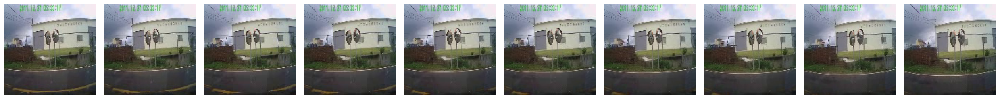

In [12]:
import numpy as np
from openstl.utils import show_video_line

# show the given frames from an example
inputs = np.load('./work_dirs/custom_exp/saved/inputs.npy')
preds = np.load('./work_dirs/custom_exp/saved/preds.npy')
trues = np.load('./work_dirs/custom_exp/saved/trues.npy')

example_idx = 3
show_video_line(trues[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

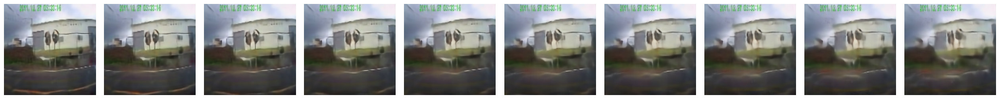

In [13]:
example_idx = 3
show_video_line(preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

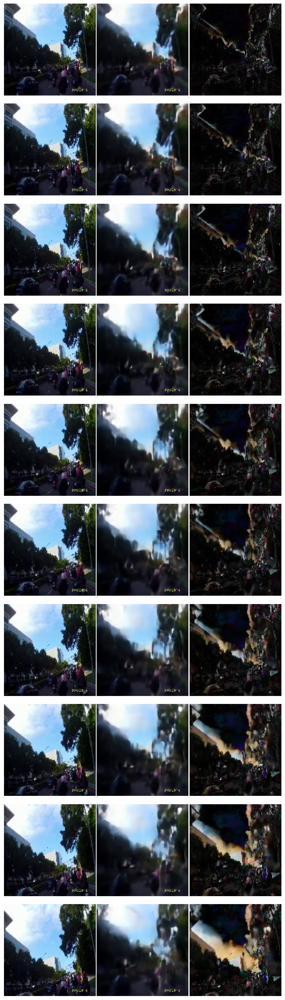

In [14]:
from openstl.utils import show_video_lines_comparison
example_idx = 2
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

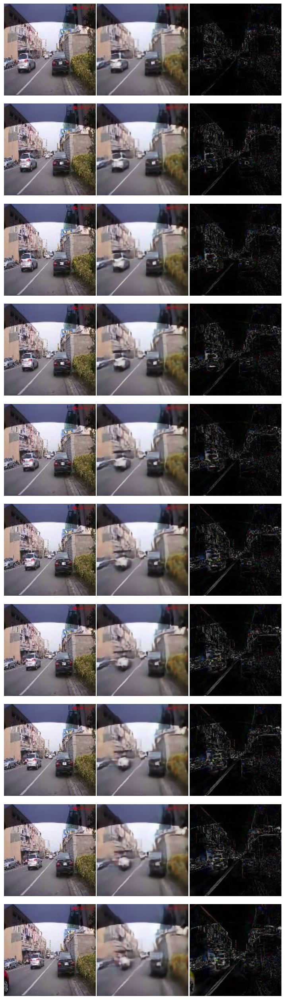

In [15]:
from openstl.utils import show_video_lines_comparison
example_idx = 320
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

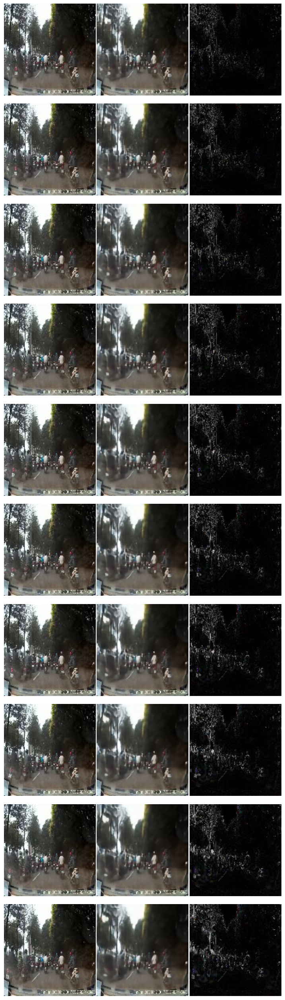

In [16]:
from openstl.utils import show_video_lines_comparison
example_idx = 184
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

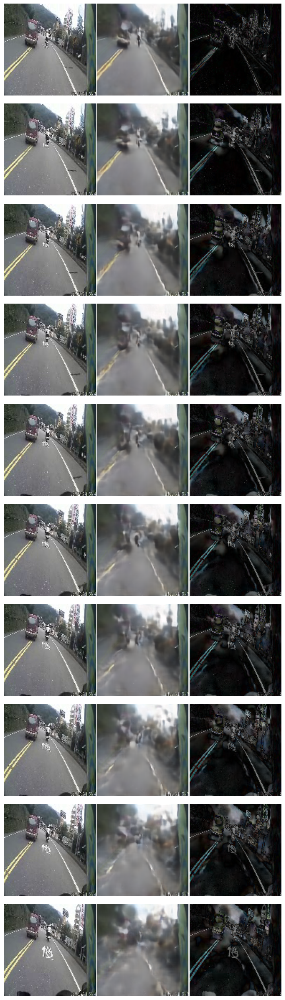

In [17]:
from openstl.utils import show_video_lines_comparison
example_idx = 8
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

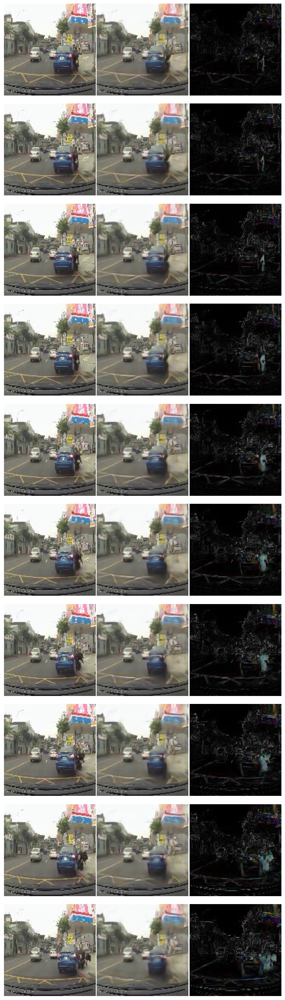

In [18]:
from openstl.utils import show_video_lines_comparison
example_idx = 215
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)